# Automat komórkowy: walka żywiołów
Konrad Słotta 277442

Poniższy automat komórkowy jest implementacją cyklicznego automatu komórkowego (*ang. cyclic cellular automaton*, źródło: https://en.wikipedia.org/wiki/Cyclic_cellular_automaton). Działa on na zasadzie gry „papier, kamień, nożyce”, ale dla czterech stanów (żywiołów). W tym automacie cykl wygląda następująco:

- Woda pokonuje Ogień,
- Ogień pokonuje Ziemię,
- Ziemia pokonuje Powietrze,
- Powietrze pokonuje Wodę.

Sąsiedztwo jest rozpatrywane jako sąsiedztwo Moore'a, czyli jako zbiór ośmiu komórek (góra, dół, lewo, prawo oraz skosy) otaczających komórkę centralną. Zaimplementowane warunki brzegowe to:

1. Twarda ściana - poza brzegami nic nie ma i nie są rozpatrywane jako sąsiedztwo,
2. Periodyczne - lewa krawędź łączy się z prawą, a górna z dolną.

In [93]:
using Colors
using Plots
using Random
using BenchmarkTools
using DataFrames
using Serialization

## Funkcja jednego kroku automatu
Funkcja `krok` przyjmuje parametry `siatka`, która jest macierzą zawierającą obecną siatkę stanów komórek oraz `brzeg` odpowiadający za wybór sposobu rozpatrywania warunkó brzegowych (`:sciana` albo `:periodyczny`). Zwraca nową siatkę po wykonaniu jednego kroku symulacji.

Funkcja pomocnicza `walka` rozpatruje `stan` i na tej podstawie definiuje jego przeciwnika.

In [94]:
const POWIETRZE = UInt8(0)
const WODA      = UInt8(1)
const OGIEN     = UInt8(2)
const ZIEMIA    = UInt8(3)

function walka(stan)
    return (stan + 1) % 4
end


function krok(siatka, brzeg=:sciana)
    N, M = size(siatka)
    nowa = copy(siatka)

    for y in 1:N, x in 1:M
        zywiol = siatka[y, x]
        przeciwnik = walka(zywiol)
        
        cnt = 0

        for dy in -1:1, dx in -1:1
            dx == 0 && dy == 0 && continue

            ny = y + dy
            nx = x + dx

            if brzeg == :sciana
                if ny < 1 || ny > N || nx < 1 || nx > M
                    continue
                end
            elseif brzeg == :periodyczny
                ny = mod1(ny, N)
                nx = mod1(nx, M)
            else
                error("Nieznany warunek brzegowy: $brzeg")
            end
            
            if siatka[ny, nx] == przeciwnik
                cnt += 1
            end
            
            if cnt >= 3
                nowa[y, x] = przeciwnik
                break
            end
        end
    end

    return nowa
end


krok (generic function with 2 methods)

## Funkcja tworząca animację i zapis do pliku binarnego symulacji

Funkcja `animacja` tworzy animację automatu komórkowego. Jak argumenty przyjmuje siatkę pierwszej klatki symulacji (`siatka`), liczbę klatek (`T`), liczbę klatek na sekundę (`fps`), typ warunku brzegowego (`brzeg`) oraz ścieżkę zapisu pliku (`sciezka`). Zwraca plik w formacie .gif oraz plik binarny .bin z zapisem symulacji.

In [95]:
function animacja(siatka, T, fps=5, brzeg=:sciana, sciezka_gif="automat.gif", sciezka_bin="automat.bin")

    historia = Vector{Matrix{UInt8}}()
    push!(historia, copy(siatka))

    anim = @animate for t in 1:T
        siatka .= krok(siatka, brzeg)
        
        push!(historia, copy(siatka))

        heatmap(
            siatka,
            c = cgrad([:gray, :blue, :red, :green], 4, categorical=true),
            clims = (0, 3),
            aspect_ratio = 1,
            axis = false,
            title = "t = $t",
            legend = :outerleft,
            size = (1000, 800)
        )

        plot!(NaN .* [0], NaN .* [0], label="POWIETRZE", color=:gray)
        plot!(NaN .* [0], NaN .* [0], label="WODA",      color=:blue)
        plot!(NaN .* [0], NaN .* [0], label="OGIEŃ",     color=:red)
        plot!(NaN .* [0], NaN .* [0], label="ZIEMIA",    color=:green)
    end

    open(sciezka_bin, "w") do io
        serialize(io, historia)
    end

    gif(anim, sciezka_gif, fps=fps)
end

animacja (generic function with 5 methods)

## Przykład wizualizacji

In [96]:
rng = MersenneTwister(42)
N = 100
siatka = rand(rng, UInt8(0):UInt8(3), N, N)

100×100 Matrix{UInt8}:
 0x03  0x00  0x00  0x00  0x03  0x02  …  0x01  0x01  0x02  0x01  0x02  0x01
 0x02  0x02  0x02  0x03  0x03  0x02     0x00  0x02  0x00  0x03  0x03  0x03
 0x01  0x01  0x03  0x03  0x02  0x03     0x01  0x02  0x01  0x03  0x01  0x01
 0x02  0x00  0x03  0x03  0x01  0x01     0x00  0x03  0x01  0x00  0x03  0x01
 0x02  0x01  0x00  0x01  0x00  0x02     0x00  0x00  0x01  0x00  0x00  0x01
 0x00  0x02  0x03  0x02  0x01  0x01  …  0x03  0x01  0x01  0x02  0x01  0x01
 0x03  0x01  0x01  0x00  0x03  0x03     0x03  0x02  0x00  0x03  0x01  0x02
 0x03  0x00  0x02  0x00  0x00  0x00     0x03  0x03  0x01  0x01  0x00  0x00
 0x03  0x01  0x03  0x00  0x03  0x01     0x03  0x02  0x01  0x00  0x01  0x03
 0x00  0x03  0x00  0x02  0x03  0x01     0x00  0x01  0x01  0x02  0x00  0x02
 0x01  0x00  0x02  0x00  0x01  0x02  …  0x00  0x03  0x02  0x00  0x00  0x03
 0x00  0x01  0x00  0x03  0x01  0x00     0x00  0x03  0x01  0x02  0x00  0x02
 0x01  0x02  0x03  0x02  0x03  0x02     0x03  0x01  0x00  0x02  0x00  0x03
  

#### Warunek brzegowy: twarda ściana

[ Info: Saved animation to c:\Users\konra\277442\obliczenia naukowe\Obliczenia_naukowe\automaty_komorkowe\automat.gif


Plots.AnimatedGif("c:\\Users\\konra\\277442\\obliczenia naukowe\\Obliczenia_naukowe\\automaty_komorkowe\\automat.gif")
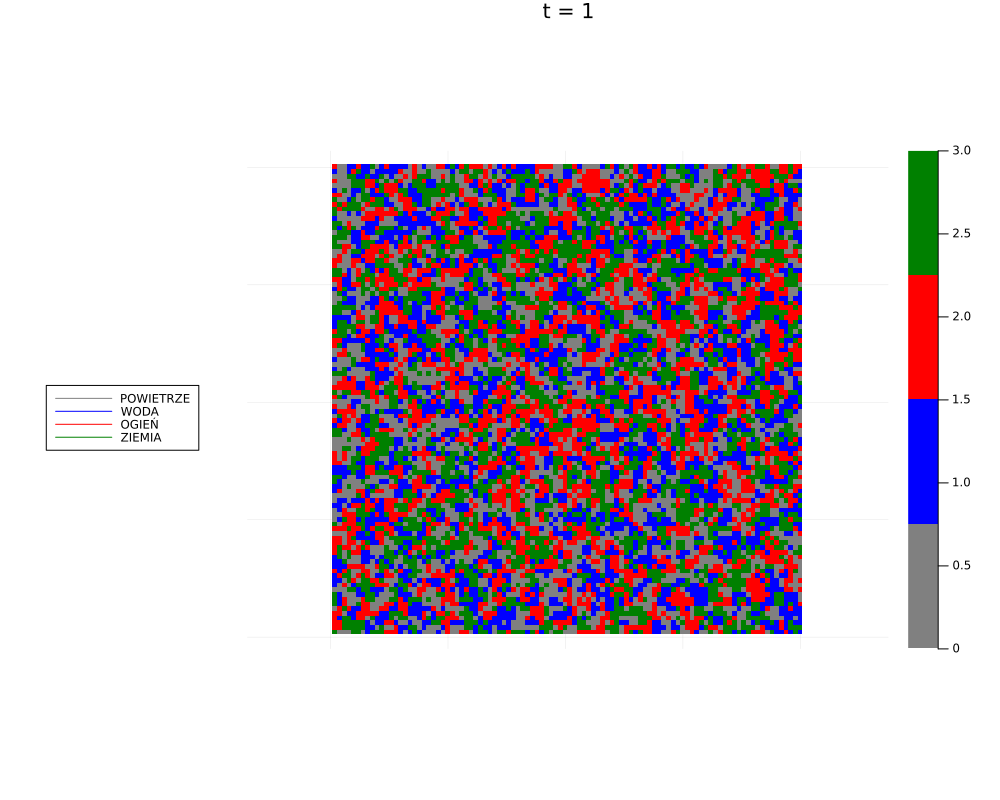

In [97]:
animacja(siatka, 1000, 10)

In [98]:
rng = MersenneTwister(42)
N = 100
siatka = rand(rng, UInt8(0):UInt8(3), N, N)

100×100 Matrix{UInt8}:
 0x03  0x00  0x00  0x00  0x03  0x02  …  0x01  0x01  0x02  0x01  0x02  0x01
 0x02  0x02  0x02  0x03  0x03  0x02     0x00  0x02  0x00  0x03  0x03  0x03
 0x01  0x01  0x03  0x03  0x02  0x03     0x01  0x02  0x01  0x03  0x01  0x01
 0x02  0x00  0x03  0x03  0x01  0x01     0x00  0x03  0x01  0x00  0x03  0x01
 0x02  0x01  0x00  0x01  0x00  0x02     0x00  0x00  0x01  0x00  0x00  0x01
 0x00  0x02  0x03  0x02  0x01  0x01  …  0x03  0x01  0x01  0x02  0x01  0x01
 0x03  0x01  0x01  0x00  0x03  0x03     0x03  0x02  0x00  0x03  0x01  0x02
 0x03  0x00  0x02  0x00  0x00  0x00     0x03  0x03  0x01  0x01  0x00  0x00
 0x03  0x01  0x03  0x00  0x03  0x01     0x03  0x02  0x01  0x00  0x01  0x03
 0x00  0x03  0x00  0x02  0x03  0x01     0x00  0x01  0x01  0x02  0x00  0x02
 0x01  0x00  0x02  0x00  0x01  0x02  …  0x00  0x03  0x02  0x00  0x00  0x03
 0x00  0x01  0x00  0x03  0x01  0x00     0x00  0x03  0x01  0x02  0x00  0x02
 0x01  0x02  0x03  0x02  0x03  0x02     0x03  0x01  0x00  0x02  0x00  0x03
  

#### Warunek brzegowy: periodyczny

[ Info: Saved animation to c:\Users\konra\277442\obliczenia naukowe\Obliczenia_naukowe\automaty_komorkowe\automat.gif


Plots.AnimatedGif("c:\\Users\\konra\\277442\\obliczenia naukowe\\Obliczenia_naukowe\\automaty_komorkowe\\automat.gif")
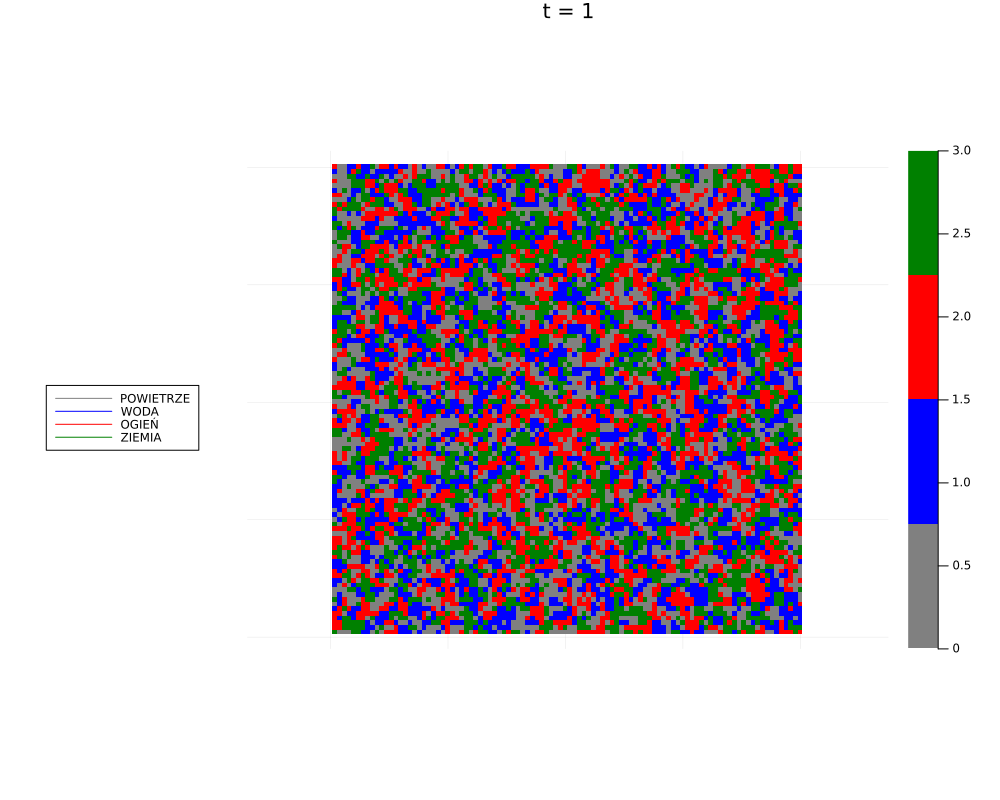

In [99]:
animacja(siatka, 1000, 10, :periodyczny)

## Analiza szybkości i alokacji w zależności od rozmiaru planszy

Do przeprowadzenia analizy wykorzystano funkcję `@benchmark` z pakietu `BenchmarkTools`. Pierwsza tabela przedstawia czas działania i alokację funkcji `krok` ze ścianą jako warunek brzegowy. Druga tabela natomiast rozpatruje tą funkcję z periodycznym warunkiem brzegowym.

In [100]:
rozmiary = [50, 250, 500, 750, 1000]

wyniki = DataFrame(
    N = Int[],
    time_ms = Float64[],
    alloc_kb = Float64[],
    allocs = Int[]
)

for N in rozmiary
    siatka = rand(UInt8(0):UInt8(3), N, N)

    b = @benchmark krok($siatka, :sciana)

    push!(wyniki, (
        N,
        minimum(b.times) / 1e6,
        b.memory / 1024,
        b.allocs
    ))
end

wyniki.time_ms .= round.(wyniki.time_ms; digits=3)
wyniki.alloc_kb .= round.(wyniki.alloc_kb; digits=1)

println(wyniki)

5×4 DataFrame
 Row │ N      time_ms  alloc_kb  allocs 
     │ Int64  Float64  Float64   Int64  
─────┼──────────────────────────────────
   1 │    50    0.022       2.6       3
   2 │   250    0.637      61.1       3
   3 │   500    3.068     244.3       3
   4 │   750    6.377     549.5       3
   5 │  1000   12.553     976.6       3


In [101]:
rozmiary = [50, 250, 500, 750, 1000]

wyniki = DataFrame(
    N = Int[],
    time_ms = Float64[],
    alloc_kb = Float64[],
    allocs = Int[]
)

for N in rozmiary
    siatka = rand(UInt8(0):UInt8(3), N, N)

    b = @benchmark krok($siatka, :periodyczny)

    push!(wyniki, (
        N,
        minimum(b.times) / 1e6,
        b.memory / 1024,
        b.allocs
    ))
end

wyniki.time_ms .= round.(wyniki.time_ms; digits=3)
wyniki.alloc_kb .= round.(wyniki.alloc_kb; digits=1)

println(wyniki)

5×4 DataFrame
 Row │ N      time_ms  alloc_kb  allocs 
     │ Int64  Float64  Float64   Int64  
─────┼──────────────────────────────────
   1 │    50    0.049       2.6       3
   2 │   250    1.425      61.1       3
   3 │   500    5.937     244.3       3
   4 │   750   13.56      549.5       3
   5 │  1000   24.879     976.6       3


Dane pokazują, że oba warianty warunków brzegowych zachowują oczekiwaną złożoność obliczeniową $O(N^2)$, co wynika z kwadratowego wzrostu czasu wykonania wraz z rozmiarem siatki. Jednocześnie widoczna jest istotna różnica w stałej czasowej: implementacja periodyczna jest konsekwentnie około dwa razy wolniejsza od wariantu ze „ścianą”, mimo identycznej liczby alokacji i liniowo rosnącego, zgodnego z $O(N^2)$ zużycia pamięci. Stałe wartości `allocs` oraz proporcjonalny wzrost pamięci potwierdzają brak dodatkowych niekontrolowanych alokacji i stabilność implementacji.

## Funkcja do testowania warunków początkowych

Funkcja `wp_wlasne` pozwala na stworzenie własnej początkowej siatki. Możemy ustawić losowe warunki początkowe lub utworzyć własną siatkę podając jej rozmiar `N`, sposób generowania - losowy (`losowy = true`) albo własny (`losowy = false`) na podstawie listy koordynatów i żywiołu, który chcemy w to miejsce wstawić `wzory`.

In [102]:
function wp_wlasne(N; losowe=false, wzory=[])
    siatka = losowe ? rand(UInt8(0):UInt8(3), N, N) : fill(UInt8(0), N, N)

    for (coords, stan) in wzory
        for (y, x) in coords
            siatka[y, x] = UInt8(stan)
        end
    end

    return siatka
end

wp_wlasne (generic function with 1 method)

[ Info: Saved animation to c:\Users\konra\277442\obliczenia naukowe\Obliczenia_naukowe\automaty_komorkowe\automat.gif


Plots.AnimatedGif("c:\\Users\\konra\\277442\\obliczenia naukowe\\Obliczenia_naukowe\\automaty_komorkowe\\automat.gif")
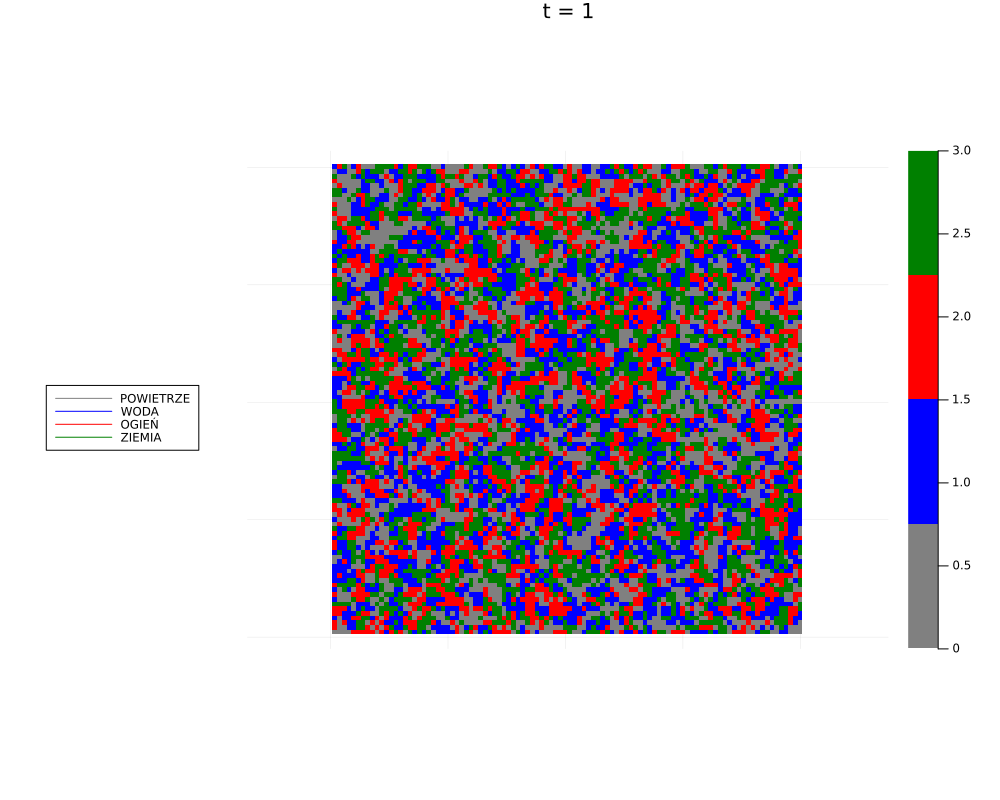

In [103]:
losowa_siatka = wp_wlasne(100; losowe=true)
animacja(losowa_siatka, 100, 10)

[ Info: Saved animation to c:\Users\konra\277442\obliczenia naukowe\Obliczenia_naukowe\automaty_komorkowe\automat.gif


Plots.AnimatedGif("c:\\Users\\konra\\277442\\obliczenia naukowe\\Obliczenia_naukowe\\automaty_komorkowe\\automat.gif")
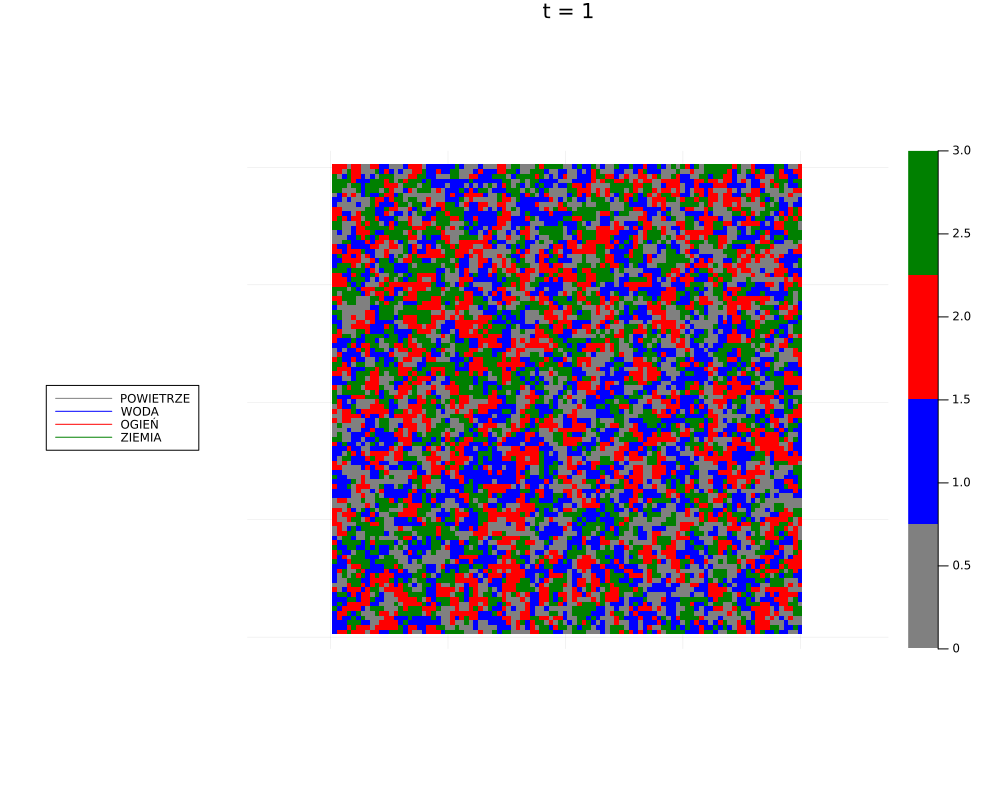

In [104]:
losowa_siatka = wp_wlasne(100; losowe=true)
animacja(losowa_siatka, 100, 10, :periodyczny)

Własne nielosowe warunki początkowe - cztery kwadraty

In [105]:
function cztery_kwadraty(N)
    midy = div(N, 2)
    midx = div(N, 2)

    powietrze = [(y, x) for y in 1:midy, x in 1:midx]
    ogien      = [(y, x) for y in 1:midy, x in midx+1:N]
    ziemia     = [(y, x) for y in midy+1:N, x in 1:midx]
    woda    = [(y, x) for y in midy+1:N, x in midx+1:N]

    return [
        (powietrze, UInt8(0)),
        (woda, UInt8(1)),
        (ogien, UInt8(2)),
        (ziemia, UInt8(3))
    ]
end

cztery_kwadraty (generic function with 1 method)

[ Info: Saved animation to c:\Users\konra\277442\obliczenia naukowe\Obliczenia_naukowe\automaty_komorkowe\automat.gif


Plots.AnimatedGif("c:\\Users\\konra\\277442\\obliczenia naukowe\\Obliczenia_naukowe\\automaty_komorkowe\\automat.gif")
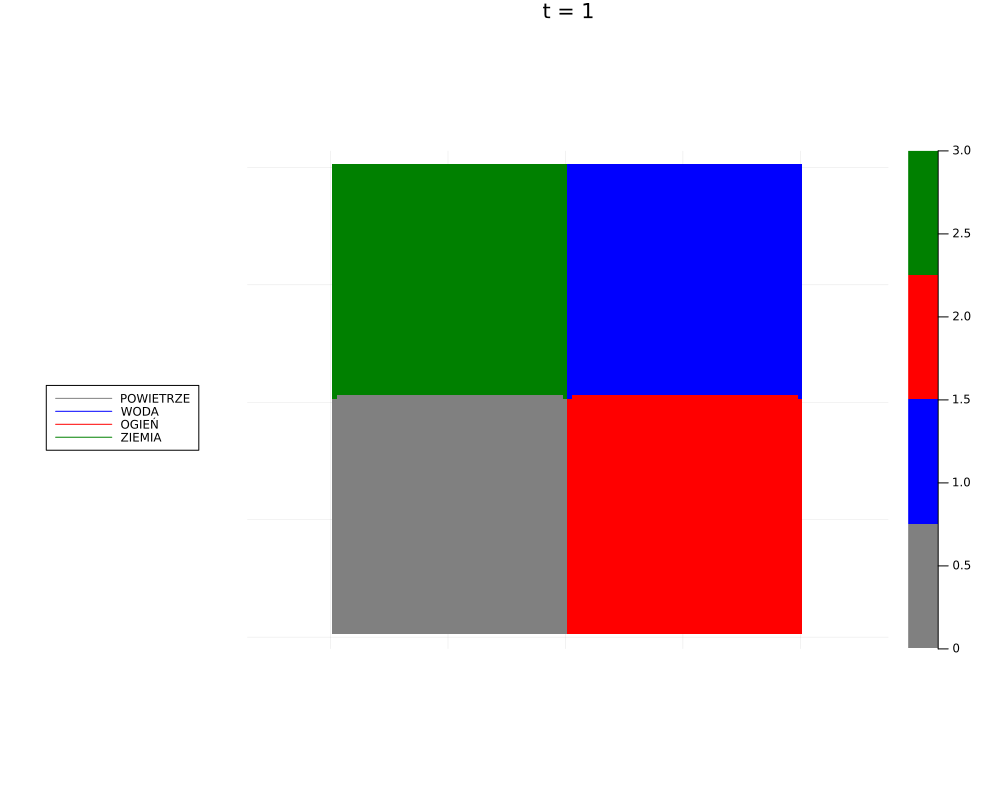

In [106]:
wlasna_siatka = wp_wlasne(100; wzory=cztery_kwadraty(100))
animacja(wlasna_siatka, 100, 10)

[ Info: Saved animation to c:\Users\konra\277442\obliczenia naukowe\Obliczenia_naukowe\automaty_komorkowe\automat.gif


Plots.AnimatedGif("c:\\Users\\konra\\277442\\obliczenia naukowe\\Obliczenia_naukowe\\automaty_komorkowe\\automat.gif")
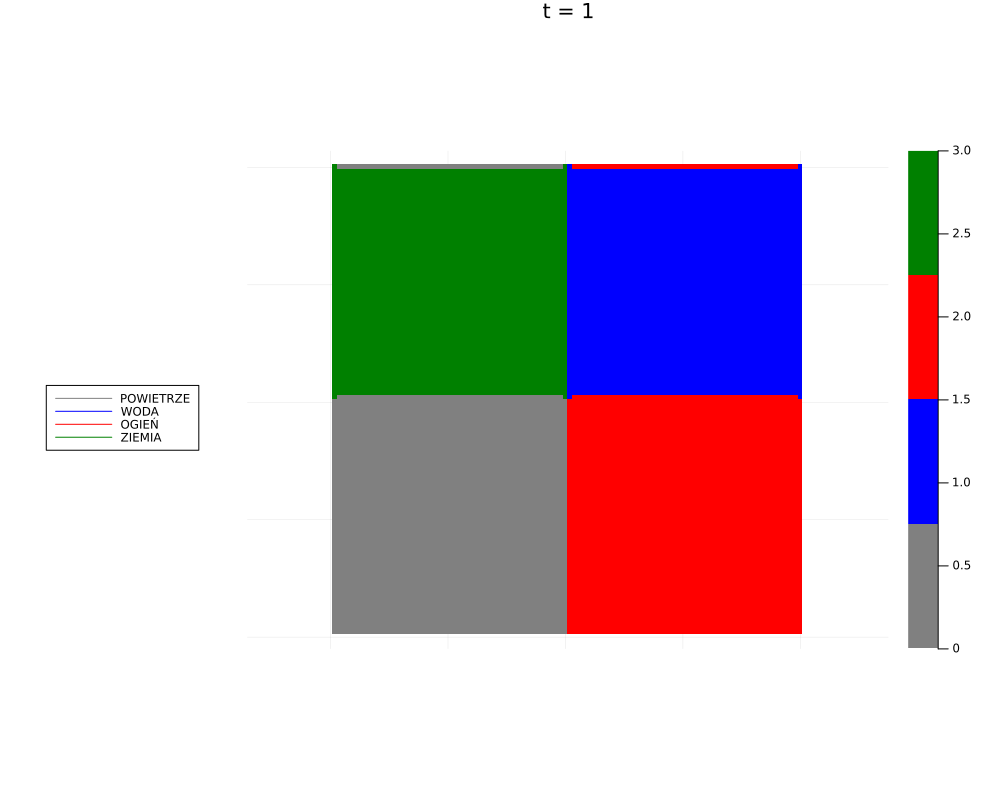

In [107]:
wlasna_siatka = wp_wlasne(100; wzory=cztery_kwadraty(100))
animacja(wlasna_siatka, 50, 10, :periodyczny)